In [1]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [2]:
path = "/content/drive/MyDrive/datasets/Chicago_Crimes_2012_to_2017.csv"

In [3]:
!pip install category_encoders
!pip install eli5
!pip install -U pandas-profiling

     |████████████████████████████████| 81kB 5.1MB/s 
     |████████████████████████████████| 112kB 13.3MB/s 
     |████████████████████████████████| 245kB 11.9MB/s 
     |████████████████████████████████| 1.1MB 25.3MB/s 
     |████████████████████████████████| 81kB 8.9MB/s 
     |████████████████████████████████| 81kB 8.6MB/s 
     |████████████████████████████████| 61kB 7.1MB/s 
     |████████████████████████████████| 3.2MB 37.4MB/s 
     |████████████████████████████████| 296kB 39.2MB/s 
  Created wheel for htmlmin: filename=htmlmin-0.1.12-cp37-none-any.whl size=27085 sha256=150ff8dc6184a195be3430069790a7b2198170072f3cedebb01155d2ca29acf4
  Stored in directory: /root/.cache/pip/wheels/43/07/ac/7c5a9d708d65247ac1f94066cf1db075540b85716c30255459
  Created wheel for phik: filename=phik-0.11.2-cp37-none-any.whl size=1107413 sha256=1a60070b746641edee4c795ce2418dbc1c3463130a62711f1b626dc0e2d5c33f
  Stored in directory: /root/.cache/pip/wheels/c0/a3/b0/f27b1cfe32ea131a3715169132ff6d8565378

In [4]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, roc_auc_score, roc_curve, mean_absolute_error
from sklearn.utils.multiclass import unique_labels
from sklearn.linear_model import LogisticRegression
from sklearn.impute import SimpleImputer
from sklearn.pipeline import make_pipeline
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import eli5
from eli5.sklearn import PermutationImportance
import category_encoders as ce
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.feature_selection.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.feature_selection. Anything that cannot be imported from sklearn.feature_selection is now part of the private API.
  warnings.warn(message, FutureWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [5]:
%matplotlib inline

In [6]:
df= pd.read_csv(path, sep=",")

In [7]:
print(df.shape)

(361741, 24)


In [8]:
df.head()

,CrimeID,Case Number,Date,Month,Day,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,Beat,District,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
0,10029021,HY218730,4/12/2015,December,Friday,019XX W 21ST ST,1025,ARSON,AGGRAVATED,RESIDENCE,False,False,1234,12.0,25.0,31.0,9,1163859.0,1890091.0,2015,9/01/2015 15:10,41.854038,-87.674057,"(41.854037887, -87.674057333)"
1,10109149,HY297697,6/10/2015,October,Tuesday,034XX N OSCEOLA AVE,1792,KIDNAPPING,CHILD ABDUCTION/STRANGER,STREET,False,False,1631,16.0,36.0,17.0,20,1125813.0,1921848.0,2015,9/01/2015 15:10,41.941900,-87.812996,"(41.941900365, -87.812996415)"
2,10026582,HY216050,4/09/2015,September,Friday,022XX N LAWLER AVE,910,MOTOR VEHICLE THEFT,AUTOMOBILE,STREET,False,False,2522,25.0,31.0,19.0,7,1142359.0,1914358.0,2015,12/01/2015 15:58,41.921055,-87.752368,"(41.921055344, -87.752368409)"
3,10019181,HY208405,4/02/2015,February,Wednesday,087XX S SAGINAW AVE,041A,BATTERY,AGGRAVATED: HANDGUN,STREET,True,False,423,4.0,7.0,46.0,04B,1195397.0,1847468.0,2015,11/02/2015 15:55,41.736355,-87.559711,"(41.736355209, -87.559710673)"
4,10029325,HY219256,4/11/2015,November,Wednesday,0000X S HALSTED ST,860,THEFT,RETAIL THEFT,GROCERY FOOD STORE,True,False,1232,12.0,27.0,28.0,6,1171058.0,1900047.0,2015,12/02/2015 15:52,41.881203,-87.647342,"(41.881203182, -87.647342333)"


In [9]:
df.describe()

,CrimeID,Beat,District,Ward,Community Area,X Coordinate,Y Coordinate,Year,Latitude,Longitude
count,3.617410e+05,361741.000000,361740.000000,361737.000000,361731.000000,3.608680e+05,3.608680e+05,361741.000000,360868.000000,360868.000000
mean,9.154340e+06,1153.135536,11.270728,22.847265,37.595995,1.164375e+06,1.885253e+06,2012.940457,41.840730,-87.672319
std,4.408294e+05,692.830525,6.912999,13.753419,21.464206,1.957854e+04,3.584322e+04,0.835120,0.098741,0.070170
min,2.085900e+04,111.000000,1.000000,1.000000,0.000000,0.000000e+00,0.000000e+00,2012.000000,36.619446,-91.686566
25%,8.785609e+06,613.000000,6.000000,10.000000,23.000000,1.152507e+06,1.858575e+06,2012.000000,41.767260,-87.715437
50%,9.147912e+06,1024.000000,10.000000,23.000000,32.000000,1.165982e+06,1.890749e+06,2013.000000,41.855963,-87.666247
75%,9.521796e+06,1712.000000,17.000000,34.000000,57.000000,1.176368e+06,1.908713e+06,2014.000000,41.905284,-87.628074
max,1.055035e+07,2535.000000,31.000000,50.000000,77.000000,1.205119e+06,1.951507e+06,2016.000000,42.022549,-87.524529


In [10]:
df.describe(exclude='number').T.sort_values(by='unique')

,count,unique,top,freq
Arrest,361741,2,False,259594
Domestic,361741,2,False,308580
Day,361741,7,Tuesday,52887
Month,361741,12,January,35501
FBI Code,361741,26,6,81970
Primary Type,361741,32,THEFT,81970
Updated On,361741,65,2/04/2016 6:33,359939
Location Description,361526,101,STREET,80394
Description,361741,316,SIMPLE,37318
IUCR,361741,336,820,33688


In [11]:
#Check for null values
df.isnull().sum()

CrimeID                   0
Case Number               0
Date                      0
Month                     0
Day                       0
Block                     0
IUCR                      0
Primary Type              0
Description               0
Location Description    215
Arrest                    0
Domestic                  0
Beat                      0
District                  1
Ward                      4
Community Area           10
FBI Code                  0
X Coordinate            873
Y Coordinate            873
Year                      0
Updated On                0
Latitude                873
Longitude               873
Location                873
dtype: int64

In [12]:
print('Just', (873/361741)*100,'% of the data are null values. \nFor this reason We will drop all these rows')

Just 0.24133288734204858 % of the data are null values. 
For this reason We will drop all these rows


In [13]:
#Droping null values
df= df.dropna()

In [14]:
#size after dropping nan values
df.shape

(360646, 24)

In [15]:
df.dtypes

CrimeID                   int64
Case Number              object
Date                     object
Month                    object
Day                      object
Block                    object
IUCR                     object
Primary Type             object
Description              object
Location Description     object
Arrest                     bool
Domestic                   bool
Beat                      int64
District                float64
Ward                    float64
Community Area          float64
FBI Code                 object
X Coordinate            float64
Y Coordinate            float64
Year                      int64
Updated On               object
Latitude                float64
Longitude               float64
Location                 object
dtype: object

In [16]:
#Drop duplicate rows
df=df.drop_duplicates()

In [17]:
df['Year'].value_counts()

2012    132576
2013    121091
2014    105427
2016      1400
2015       152
Name: Year, dtype: int64

Text(0.5, 1.0, 'Distribution of Arrest in Chicago')

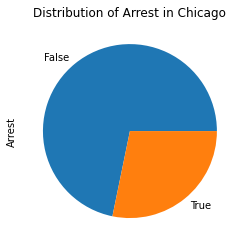

In [18]:
df['Arrest'].value_counts().plot(kind='pie')
plt.title("Distribution of Arrest in Chicago")

Text(0.5, 1.0, 'Crimes in Chicago Ward Wise')

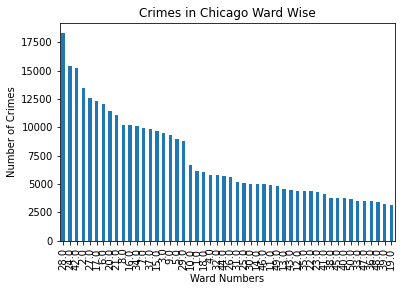

In [19]:
df['Ward'].value_counts().plot(kind='bar')
plt.ylabel("Number of Crimes")
plt.xlabel("Ward Numbers")
plt.title("Crimes in Chicago Ward Wise")

Text(0.5, 1.0, 'Types of Crimes in Chicago')

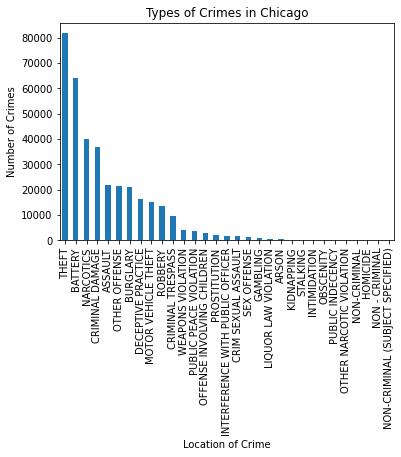

In [20]:
df['Primary Type'].value_counts().plot(kind='bar')
plt.ylabel("Number of Crimes")
plt.xlabel("Location of Crime")
plt.title("Types of Crimes in Chicago")

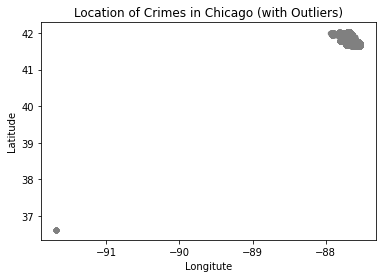

In [21]:
#Visualization of the Longitude and Latitude.
plt.scatter('Longitude', 'Latitude', c='gray', data=df, s=20)
plt.ylabel("Latitude")
plt.xlabel("Longitute")
plt.title("Location of Crimes in Chicago (with Outliers)")
plt.show();

In [22]:
outliers = ( df['Location'] == '(36.619446395, -91.686565684)') # Outliers

In [23]:
df = df[-outliers] # Removing Outliers

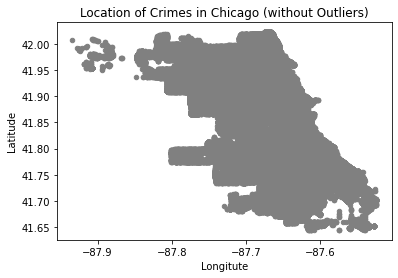

In [24]:
plt.scatter('Longitude', 'Latitude', c='gray', data=df, s=20)
plt.ylabel("Latitude")
plt.xlabel("Longitute")
plt.title("Location of Crimes in Chicago (without Outliers)")
plt.show() #After removing Outliers

In [41]:
a = df.groupby(['Arrest', 'Domestic'])
a.count()

CrimeID  Case Number    Date  ...  Latitude  Longitude  Location
Arrest Domestic                                ...                               
False  False      216324       216324  216324  ...    216324     216324    216324
       True        42497        42497   42497  ...     42497      42497     42497
True   False       91204        91204   91204  ...     91204      91204     91204
       True        10593        10593   10593  ...     10593      10593     10593

[4 rows x 22 columns]

In [ ]:
#change true and false by number to plot the data in a map with different colors
df= df.replace({False: 0, True: 1})

In [ ]:
df.to_csv("Cleaned_Data", index=False)

In [ ]:
fig = px.scatter_mapbox(df, lat='Latitude', lon='Longitude', color='Arrest',hover_name='Primary Type', opacity=0.6)
fig.update_layout(mapbox_style='open-street-map')
fig.show()

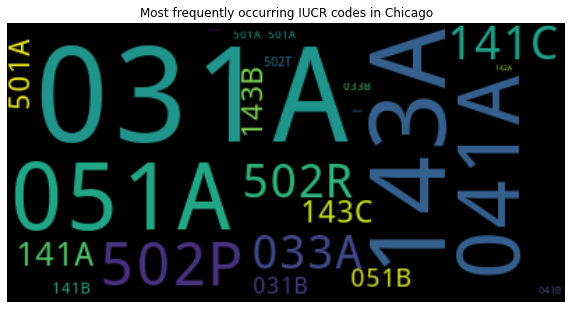

In [ ]:
# Join together a single string of IUCR codes
df.index = pd.DatetimeIndex(df.Date)
crime_types_code = " ".join(crime for crime in df ["IUCR"])

# Create and generate a word cloud image 
crime_code_wordcloud = WordCloud().generate(crime_types_code)

# Plot wordcloud image
plt.figure (figsize=[10, 10])
plt.imshow (crime_code_wordcloud, interpolation="bilinear")
plt.axis ("off")
plt.title("Most frequently occurring IUCR codes in Chicago")
plt.show()

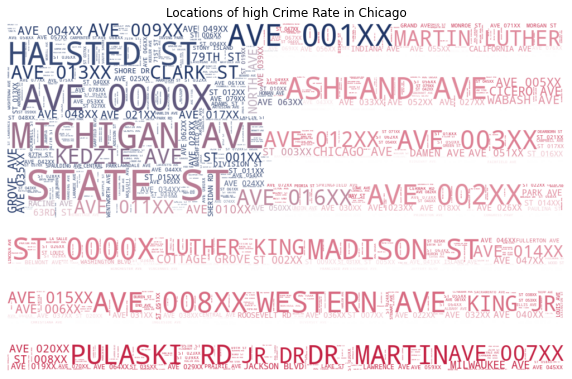

In [ ]:
# Drop NaN Values in ["Block"] column
df_wordcloud = df.copy () 
df_wordcloud.dropna (axis=0, subset=["Block"], inplace=True)

# Create string of Block codes and USA flag image mask
crime_types_location = " ".join(crime for crime in df_wordcloud["Block"])
mask = np.array(Image.open("/content/drive/MyDrive/datasets/US.jpeg"))

#Create and generate a word cloud image
crime_location_wordcloud = WordCloud(background_color="white", mode="RGBA", max_words=1000, mask=mask).generate(crime_types_location)

#Create coloring from image and plot word cloud
image_colors = ImageColorGenerator(mask)
plt.figure (figsize=[10,10])
plt.imshow (crime_location_wordcloud.recolor(color_func=image_colors), interpolation="bilinear")
plt.axis ("off")
plt.title("Locations of high Crime Rate in Chicago")
plt.show()

In [ ]:
df['Details'] = df['Primary Type'] + "," + df ['Description']

# Group by crime details and show top 10 crimes with highest arrest rates 
top_crimes = df.groupby (['Details'])['Arrest'].count() 
top_crimes = pd. DataFrame(top_crimes).nlargest (10, 'Arrest').reset_index() 
top_crimes = list(top_crimes ['Details'])
top_crimes

['THEFT,$500 AND UNDER',
 'BATTERY,DOMESTIC BATTERY SIMPLE',
 'BATTERY,SIMPLE',
 'NARCOTICS,POSS: CANNABIS 30GMS OR LESS',
 'THEFT,OVER $500',
 'CRIMINAL DAMAGE,TO PROPERTY',
 'CRIMINAL DAMAGE,TO VEHICLE',
 'ASSAULT,SIMPLE',
 'BURGLARY,FORCIBLE ENTRY',
 'MOTOR VEHICLE THEFT,AUTOMOBILE']

In [ ]:
#Spliting Data into Train, Validate andTest

target = 'Arrest'
features = df.columns.drop([target,'CrimeID'])

X = df[features]
y = df[target]

X.shape,y.shape

((360618, 22), (360618,))

In [ ]:
X_trainval, X_test, y_trainval, y_test = train_test_split(
    X, y, train_size=0.80, test_size=0.20, random_state=42)
X_trainval.shape, X_test.shape, y_trainval.shape, y_test.shape

((288494, 22), (72124, 22), (288494,), (72124,))

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(
    X_trainval, y_trainval, test_size=0.2, random_state=42)

print('X_train shape', X_train.shape)
print('y_train shape', y_train.shape)
print('X_val shape', X_val.shape)
print('y_val shape', y_val.shape)
print('X_test shape', X_test.shape)
print('y_test shape', y_test.shape)

X_train shape (230795, 22)
y_train shape (230795,)
X_val shape (57699, 22)
y_val shape (57699,)
X_test shape (72124, 22)
y_test shape (72124,)


In [ ]:
y_train.value_counts(normalize=True)

0    0.718122
1    0.281878
Name: Arrest, dtype: float64

In [ ]:
majority_class = y_train.mode()[0] 
y_pred = np.full_like(y_val, fill_value=majority_class)
accuracy_score(y_val, y_pred)

0.7178114005442036

In [ ]:
def plot_confusion_matrix(y_true, y_pred):
    labels = unique_labels(y_true)
    columns = [f'Predicted {label}' for label in labels]
    index = [f'Actual {label}' for label in labels]
    table = pd.DataFrame(confusion_matrix(y_true, y_pred), 
                         columns=columns, index=index)
    return sns.heatmap(table, annot=True, fmt='d', cmap='viridis')

Text(0.5, 1.0, 'Confusion Matrix for Majority Class Baseline')

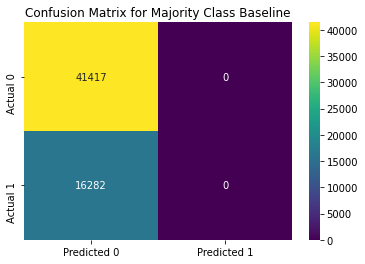

In [ ]:
plot_confusion_matrix(y_val, y_pred);
plt.title("Confusion Matrix for Majority Class Baseline")

In [ ]:
confusion_matrix(y_val, y_pred)

array([[41417,     0],
       [16282,     0]])

In [ ]:
conf_matrix=pd.DataFrame(confusion_matrix(y_val, y_pred))
conf_matrix.index = ['Actual False','Actual True']
conf_matrix.columns = ['Predicted False','Predicted True']
conf_matrix

,Predicted False,Predicted True
Actual False,41417,0
Actual True,16282,0


In [ ]:
#Get precision & recall for majority class baseline
print(classification_report(y_val, y_pred))

              precision    recall  f1-score   support

           0       0.72      1.00      0.84     41417
           1       0.00      0.00      0.00     16282

    accuracy                           0.72     57699
   macro avg       0.36      0.50      0.42     57699
weighted avg       0.52      0.72      0.60     57699



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [ ]:
y_pred_proba = np.full_like(y_val, fill_value=1.00) 
roc_auc_score(y_val, y_pred_proba)

0.5

In [ ]:
y_pred_proba = np.full_like(y_val, fill_value=0)
auc=roc_auc_score(y_val, y_pred_proba)
auc

0.5

In [ ]:
  fpr,tpr,thresholds=roc_curve(y_val, y_pred_proba)

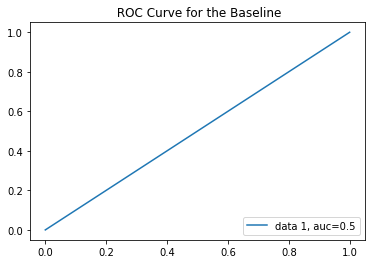

In [ ]:
plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.title(" ROC Curve for the Baseline")
plt.show()

In [ ]:
#Logistic Regression
lr = make_pipeline(
    ce.OrdinalEncoder(), 
    SimpleImputer(strategy='mean'), 
    LogisticRegression(n_jobs=-1,solver='lbfgs', random_state=42, penalty='l2'))

In [ ]:
lr.fit(X_train, y_train)

Pipeline(memory=None,
         steps=[('ordinalencoder',
                 OrdinalEncoder(cols=['Case Number', 'Date', 'Month', 'Day',
                                      'Block', 'IUCR', 'Primary Type',
                                      'Description', 'Location Description',
                                      'FBI Code', 'Updated On', 'Location'],
                                drop_invariant=False, handle_missing='value',
                                handle_unknown='value',
                                mapping=[{'col': 'Case Number',
                                          'data_type': dtype('O'),
                                          'mapping': HV281376         1
HV516517         2
HW2...
                 SimpleImputer(add_indicator=False, copy=True, fill_value=None,
                               missing_values=nan, strategy='mean',
                               verbose=0)),
                ('logisticregression',
                 LogisticRegression(C=1.0, clas

In [ ]:
y_pred_val = lr.predict(X_val)
y_pred_test = lr.predict(X_test)
print('Accuracy for the validation data= ',accuracy_score(y_val, y_pred_val))
print('Accuracy for the test data= ',accuracy_score(y_test, y_pred_test))

Accuracy for the validation data=  0.7178114005442036
Accuracy for the test data=  0.7163357550884588


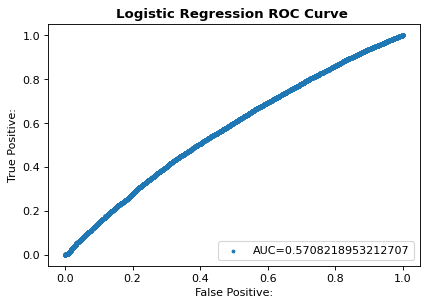

In [ ]:
lr_fp,lr_tp,thresholds = roc_curve(y_val,lr.predict_proba(X_val)[:,1])

auc_lr=roc_auc_score(y_val, lr.predict_proba(X_val)[:,1])

fig = plt.figure(dpi=80)
plt.scatter(lr_fp,lr_tp, s=6,label="AUC="+str(auc_lr))
plt.title('Logistic Regression ROC Curve ', fontweight = 'bold', fontsize = 12)
plt.legend(loc=4)
plt.xlabel('False Positive:', fontsize = 10)
plt.ylabel('True Positive:', fontsize = 10);

In [ ]:
xgb = make_pipeline(
    ce.OrdinalEncoder(), 
    SimpleImputer(strategy='mean'), 
    XGBClassifier(n_estimators=100, random_state=42, n_jobs=-1)
)

xgb.fit(X_train, y_train)

Pipeline(memory=None,
         steps=[('ordinalencoder',
                 OrdinalEncoder(cols=['Case Number', 'Date', 'Month', 'Day',
                                      'Block', 'IUCR', 'Primary Type',
                                      'Description', 'Location Description',
                                      'FBI Code', 'Updated On', 'Location'],
                                drop_invariant=False, handle_missing='value',
                                handle_unknown='value',
                                mapping=[{'col': 'Case Number',
                                          'data_type': dtype('O'),
                                          'mapping': HV281376         1
HV516517         2
HW2...
                 XGBClassifier(base_score=0.5, booster='gbtree',
                               colsample_bylevel=1, colsample_bynode=1,
                               colsample_bytree=1, gamma=0, learning_rate=0.1,
                               max_delta_step=0, max_depth=3,


In [ ]:
# XGBClassifier
y_pred_val = xgb.predict(X_val)
y_pred_test = xgb.predict(X_test)
print('Accuracy for the validation data= ',accuracy_score(y_val, y_pred_val))
print('Accuracy for the test data= ',accuracy_score(y_test, y_pred_test))

Accuracy for the validation data=  0.8782647879512643
Accuracy for the test data=  0.8784177250291165


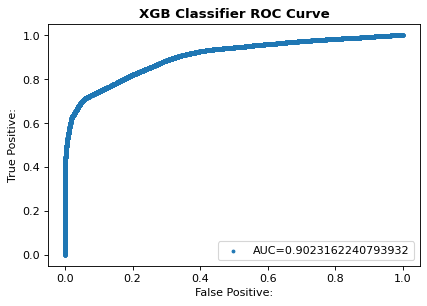

In [ ]:
xgb_fp,xgb_tp,thresholds = roc_curve(y_val,xgb.predict_proba(X_val)[:,1])

auc_xgb=roc_auc_score(y_val, xgb.predict_proba(X_val)[:,1])

fig = plt.figure(dpi=80)
plt.scatter(xgb_fp,xgb_tp, s=6,label="AUC="+str(auc_xgb))
plt.title('XGB Classifier ROC Curve', fontweight = 'bold', fontsize = 12)
plt.legend(loc=4)
plt.xlabel('False Positive:', fontsize = 10)
plt.ylabel('True Positive:', fontsize = 10);

In [ ]:
rf = make_pipeline(
    ce.OrdinalEncoder(), 
    SimpleImputer(strategy='mean'), 
    RandomForestClassifier(n_estimators=100, n_jobs=-1, random_state=42)
)

rf.fit(X_train, y_train);

In [ ]:
#Random Forest Classifier
y_pred_val = rf.predict(X_val)
y_pred_test = rf.predict(X_test)
print('Accuracy for the validation data= ',accuracy_score(y_val, y_pred_val))
print('Accuracy for the test data= ',accuracy_score(y_test, y_pred_test))

Accuracy for the validation data=  0.8856652628295117
Accuracy for the test data=  0.8838389440408186


Text(0.5, 1.0, 'Random Forest Classifier Confusion Matrix')

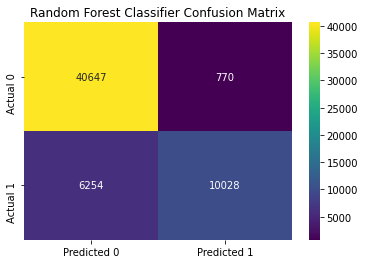

In [ ]:
#Confusion Matrix
plot_confusion_matrix(y_val, y_pred_val);
plt.title("Random Forest Classifier Confusion Matrix")

In [ ]:
conf_matrix=pd.DataFrame(confusion_matrix(y_val, y_pred_val))
conf_matrix.index = ['Actual False','Actual True']
conf_matrix.columns = ['Predicted False','Predicted True']
conf_matrix

,Predicted False,Predicted True
Actual False,40120,1297
Actual True,5300,10982


In [ ]:
print(classification_report(y_val, y_pred_val))

              precision    recall  f1-score   support

           0       0.88      0.97      0.92     41417
           1       0.89      0.67      0.77     16282

    accuracy                           0.89     57699
   macro avg       0.89      0.82      0.85     57699
weighted avg       0.89      0.89      0.88     57699



In [ ]:
rf_fp,rf_tp,thresholds = roc_curve(y_val,rf.predict_proba(X_val)[:,1])

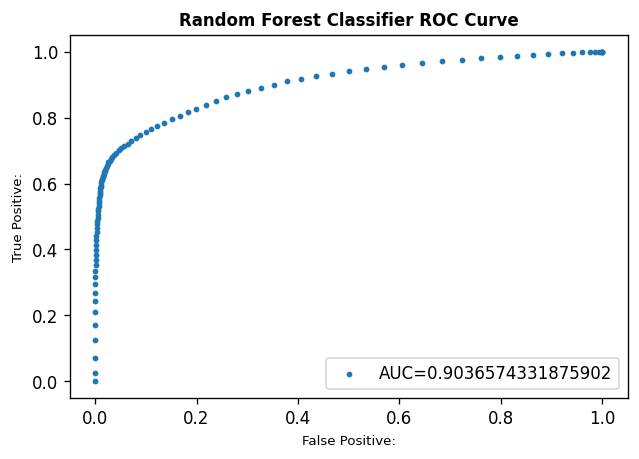

In [ ]:
auc_rf=roc_auc_score(y_val, rf.predict_proba(X_val)[:,1])

fig = plt.figure(dpi=120)
plt.scatter(rf_fp,rf_tp,s=6,label="AUC="+str(auc_rf))
plt.title('Random Forest Classifier ROC Curve', fontweight = 'bold', fontsize = 10)
plt.legend(loc=4)
plt.xlabel('False Positive:', fontsize = 8)
plt.ylabel('True Positive:', fontsize = 8);

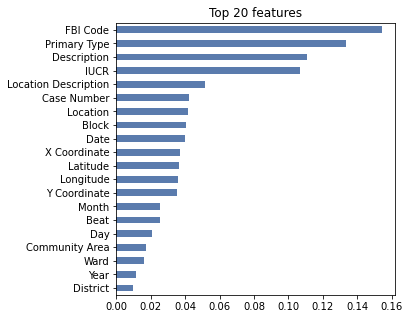

In [ ]:
#Feature importances
rf_steps = rf.named_steps['randomforestclassifier']
importances = pd.Series(rf_steps.feature_importances_, X_train.columns)

n = 20
plt.figure(figsize=(5,5))
plt.title(f'Top {n} features')
importances.sort_values()[-n:].plot.barh(color='#5a7bad');

In [ ]:
column = 'FBI Code'

#Fitting without FBI Code
rf_without = make_pipeline(
    ce.OrdinalEncoder(), 
    SimpleImputer(strategy='median'), 
    RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
)
rf_without.fit(X_train.drop(columns=column), y_train)
score_without = rf_without.score(X_val.drop(columns=column), y_val)
print(f'Validation Accuracy without {column}: {score_without}')

#Fitting with FBI Code
rf_with = make_pipeline(
    ce.OrdinalEncoder(), 
    SimpleImputer(strategy='median'), 
    RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
)
rf_with.fit(X_train, y_train)
score_with = rf_with.score(X_val, y_val)
print(f'Validation Accuracy with {column}: {score_with}')
print(f'Drop-Column Importance for {column}: {score_with - score_without}')

Validation Accuracy without FBI Code: 0.8838454739250247
Validation Accuracy with FBI Code: 0.8856652628295117
Drop-Column Importance for FBI Code: 0.0018197889044870852


In [ ]:
#Using Permutation Importance ELI5 Library
transformers = make_pipeline(
    ce.OrdinalEncoder(), 
    SimpleImputer(strategy='median')
)

X_train_transformed = transformers.fit_transform(X_train)
X_val_transformed = transformers.transform(X_val)

randomforest = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
randomforest.fit(X_train_transformed, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)

In [ ]:
#permute features
permuter = PermutationImportance(
    randomforest,
    scoring='accuracy', 
    n_iter=2, 
    random_state=42
)

permuter.fit(X_val_transformed, y_val)
feature_names = X_val.columns.tolist()

eli5.show_weights(
    permuter, 
    feature_names=feature_names
)

Weight,Feature
0.0627 ± 0.0000,FBI Code
0.0530 ± 0.0006,Primary Type
0.0452 ± 0.0009,Description
0.0241 ± 0.0005,IUCR
0.0088 ± 0.0009,Location Description
0.0023 ± 0.0006,Location
0.0023 ± 0.0001,Y Coordinate
0.0021 ± 0.0006,Domestic
0.0019 ± 0.0010,X Coordinate
0.0018 ± 0.0002,Block
